
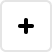
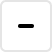
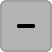
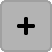
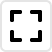
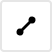
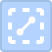

In [155]:
import pandas as pd

from lets_plot import *
from lets_plot.geo_data import *

LetsPlot.setup_html()

In [156]:
import lets_plot
lets_plot.__version__

'1.5.7.dev1'

In [157]:
income_dat = pd.read_csv('../data/US_household_income_2017.csv', encoding='latin-1')
income_dat.head(3)

,id,State_Code,State_Name,State_ab,County,City,Place,Type,Primary,Zip_Code,Area_Code,ALand,AWater,Lat,Lon,Mean,Median,Stdev,sum_w
0,1011000,1,Alabama,AL,Mobile County,Chickasaw,Chickasaw city,City,place,36611,251,10894952,909156,30.771450,-88.079697,38773,30506,33101,1638.260513
1,1011010,1,Alabama,AL,Barbour County,Louisville,Clio city,City,place,36048,334,26070325,23254,31.708516,-85.611039,37725,19528,43789,258.017685
2,1011020,1,Alabama,AL,Shelby County,Columbiana,Columbiana city,City,place,35051,205,44835274,261034,33.191452,-86.615618,54606,31930,57348,926.031000


In [158]:
income_dat = income_dat[~income_dat["State_Name"].isin(["Alaska", "Hawaii", "Puerto Rico"])]

In [159]:
income_dat = income_dat[income_dat["Mean"] > 0]
income_dat["Mean"].describe()

count     31606.000000
mean      67719.949883
std       29699.621113
min        5000.000000
25%       46827.000000
50%       61323.500000
75%       82669.750000
max      242857.000000
Name: Mean, dtype: float64

### Mean income by state

In [160]:
mean_income_state = income_dat.groupby("State_Name", as_index=False)["Mean"].mean()
mean_income_state.head(3)

,State_Name,Mean
0,Alabama,54023.752874
1,Arizona,63400.114943
2,Arkansas,52213.932153


In [161]:
state_gcoder = geocode_states("US-48")
state_gcoder.get_geocodes().head(3)

,id,state,found name
0,121519,Vermont,Vermont
1,122631,Massachusetts,Massachusetts
2,122641,New York,New York


In [162]:
ggplot() + geom_map(map=state_gcoder)

In [163]:
# Copy colors from Brewer's 'PiYG' palette: https://colorbrewer2.org/#type=diverging&scheme=PiYG&n=11
map_fill_colors = scale_fill_gradient2(low="#8e0152",mid="#f7f7f7",high="#276419", midpoint=67356)
map_settings = (theme(axis_line="blank", axis_text="blank", axis_title="blank", axis_ticks="blank") + 
                map_fill_colors + 
                coord_map() +
                ggsize(900, 400) )


In [164]:
(ggplot(mean_income_state) + 
 geom_polygon(aes(fill="Mean"), map=state_gcoder, map_join="State_Name", color="white") + 
 map_settings)

In [165]:
# inc_res
(ggplot(mean_income_state) + 
 geom_polygon(aes(fill="Mean"), map=state_gcoder.inc_res(2), map_join="State_Name", color="white") + 
 map_settings)

### Mean income by county


In [166]:
mean_income_county = income_dat.groupby(["State_Name","County"], as_index=False)["Mean"].mean()
mean_income_county.head(3)

,State_Name,County,Mean
0,Alabama,Autauga County,54086.006522
1,Alabama,Barbour County,37725.000000
2,Alabama,Blount County,55127.000000


In [167]:
county_gcoder = (geocode_counties(mean_income_county["County"])
    .states(mean_income_county["State_Name"])
    .scope("us-48")
    .drop_ambiguous()
    .drop_not_found())
county_gcoder.get_geocodes().head(3)

,id,county,found name,state
0,3697517,Autauga County,Autauga County,Alabama
1,3701595,Barbour County,Barbour County,Alabama
2,3697523,Blount County,Blount County,Alabama


In [168]:
(ggplot(mean_income_county) + 
 geom_polygon(aes(fill="Mean"), map=county_gcoder, map_join=[["State_Name", "County"],['state', 'county']], color="white") + 
 map_settings)

### Bonus tracks

In [169]:
import numpy as np
from scipy.interpolate import griddata

def interpolate_us(lons, lats, values, step, method):
    # method : "linear", "cubic" or "nearest".
    
    # target grid to interpolate to
    grid_lons = np.arange(-125, -66, step)
    grid_lats = np.arange(25, 52, step)
    grid_lons, grid_lats = np.meshgrid(grid_lons, grid_lats)
    
    # interpolate
    grid_values = griddata((lons, lats), values, (grid_lons, grid_lats), method)

    return pd.DataFrame(dict(
            lon=grid_lons.flatten(), 
            lat=grid_lats.flatten(), 
            value=grid_values.flatten()))


#### Centroids to lon,lat

In [170]:
centroids_gdf = county_gcoder.get_centroids()
centroids_gdf.head(3)

,county,found name,state,geometry
0,Autauga County,Autauga County,Alabama,POINT (-86.65117 32.50771)
1,Barbour County,Barbour County,Alabama,POINT (-85.39351 31.88341)
2,Blount County,Blount County,Alabama,POINT (-86.53304 34.01333)


In [171]:
# merge with income
centroids_gdf = centroids_gdf.merge(mean_income_county, 
                                     left_on=["state", "county"], 
                                     right_on=["State_Name", "County"], how="left")
centroids_gdf.head(3)

,county,found name,state,geometry,State_Name,County,Mean
0,Autauga County,Autauga County,Alabama,POINT (-86.65117 32.50771),Alabama,Autauga County,54086.006522
1,Barbour County,Barbour County,Alabama,POINT (-85.39351 31.88341),Alabama,Barbour County,37725.000000
2,Blount County,Blount County,Alabama,POINT (-86.53304 34.01333),Alabama,Blount County,55127.000000


In [172]:
# Get lon, lat and income for interpolation
longitude = centroids_gdf.geometry.x
latitude = centroids_gdf.geometry.y
mean_income = centroids_gdf["Mean"]

In [173]:
mean_income_interpolated = interpolate_us(longitude, latitude, mean_income, .3, "linear")
mean_income_interpolated_nona = mean_income_interpolated.dropna(inplace=False)
mean_income_interpolated_nona.head(3)

,lon,lat,value
538,-81.8,25.6,82576.389460
539,-81.5,25.6,83903.237057
540,-81.2,25.6,85230.084655


In [174]:
# US boundary
polygons_us = (geocode_countries("US")
             .get_boundaries(resolution="country")
             .explode())
polygons_us48 = polygons_us.cx[-125:-66, 25:52]

In [183]:
(ggplot(mean_income_interpolated_nona) + 
 geom_tile(aes("lon", "lat", fill="value"), height=1.4) + 
 geom_polygon(map=state_gcoder, color="black", size=0.3, alpha=0) + 
 geom_map(map=polygons_us48, size=2, color="#3E8DD2") +
 map_settings)

In [123]:
mean_income_interpolated["value"].describe()

count     11091.000000
mean      55538.717763
std       14245.293548
min       12656.312904
25%       45695.419613
50%       53448.745224
75%       62791.179132
max      147156.585935
Name: value, dtype: float64

In [124]:
mean_income_interpolated_fina = mean_income_interpolated.fillna(55538, inplace=False)

In [184]:
(ggplot(mean_income_interpolated_fina) + 
 geom_contour(aes("lon", "lat", z="value", color="..level.."), size=1, sampling="none") + 
 geom_polygon(map=state_gcoder, color="gray", alpha=0) + 
 geom_map(map=polygons_us48, size=2, color="#3E8DD2") +
 map_settings +
 scale_color_gradient2(low="#8e0152",mid="#f7f7f7",high="#276419", midpoint=67356))

In [185]:
(ggplot(mean_income_interpolated_fina) + 
 geom_contourf(aes("lon", "lat", z="value", fill="..level..")) + 
 geom_polygon(map=state_gcoder, color="black", size=0.3, alpha=0) + 
 geom_map(map=polygons_us48, size=2, color="#3E8DD2") +
 map_settings)

In [186]:
(ggplot(mean_income_interpolated_fina) + 
 geom_livemap() +
 geom_contourf(aes("lon", "lat", z="value", fill="..level..")) + 
 geom_polygon(map=state_gcoder, color="black", size=0.3, alpha=0) + 
 geom_map(map=polygons_us48, size=2, color="#3E8DD2") +
 map_settings)